### Device to CUDA or MPS

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.image import imsave
# from latex import latexify, format_axes
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 2.5 MB/s eta 0:00:00
cuda


In [40]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


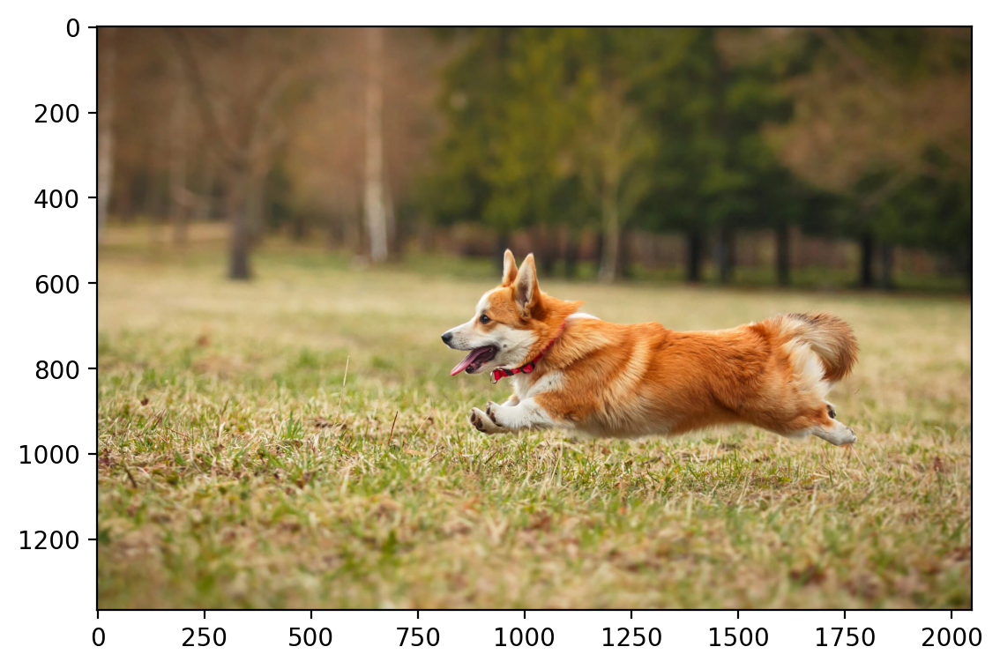

In [41]:
# latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

In [42]:
img = torchvision.transforms.functional.crop(img.cpu(), 550, 750, 400, 400)
print(img.shape)

torch.Size([3, 400, 400])


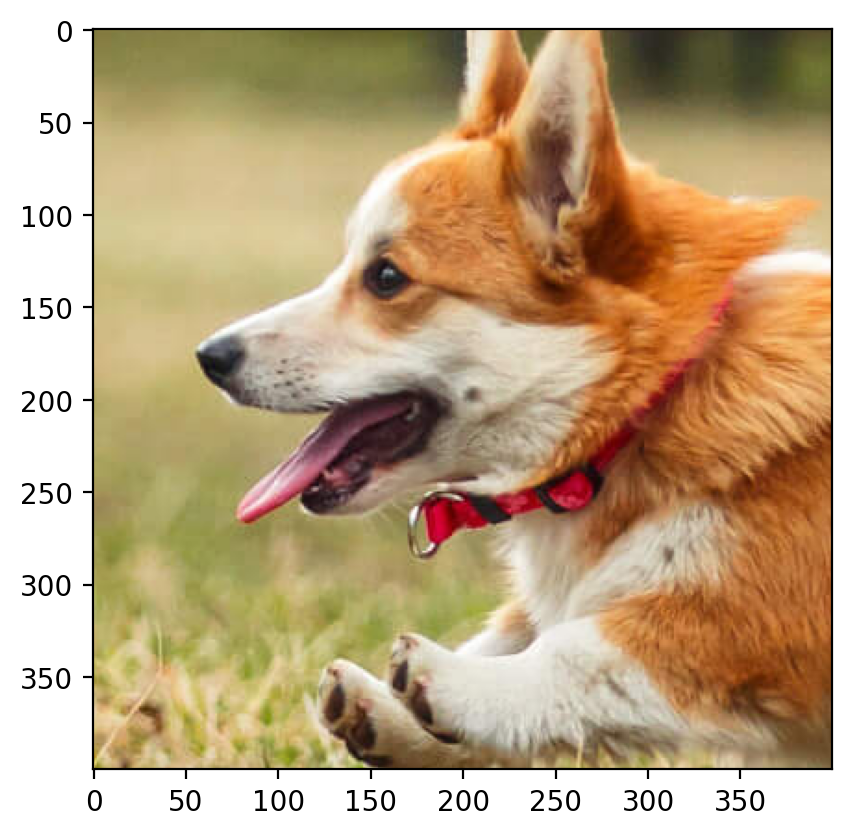

In [43]:
# latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

In [44]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device, dtype = torch.float32)
img_scaled

tensor([[[0.4902, 0.4902, 0.5216,  ..., 0.3333, 0.3451, 0.3490],
         [0.4902, 0.4902, 0.5216,  ..., 0.3373, 0.3490, 0.3529],
         [0.5020, 0.5020, 0.5137,  ..., 0.3569, 0.3569, 0.3569],
         ...,
         [0.8667, 0.8118, 0.6039,  ..., 0.4745, 0.4667, 0.4549],
         [0.8275, 0.6588, 0.5647,  ..., 0.4980, 0.4863, 0.4745],
         [0.7294, 0.5569, 0.5725,  ..., 0.5216, 0.5098, 0.4941]],

        [[0.4824, 0.4824, 0.4863,  ..., 0.2980, 0.3098, 0.3137],
         [0.4824, 0.4824, 0.4863,  ..., 0.3020, 0.3137, 0.3176],
         [0.4784, 0.4784, 0.4784,  ..., 0.3255, 0.3255, 0.3255],
         ...,
         [0.7843, 0.7373, 0.5804,  ..., 0.3804, 0.3725, 0.3608],
         [0.7529, 0.5961, 0.5451,  ..., 0.4039, 0.3922, 0.3804],
         [0.6784, 0.5098, 0.5569,  ..., 0.4275, 0.4157, 0.4000]],

        [[0.2510, 0.2510, 0.2549,  ..., 0.1765, 0.1882, 0.1922],
         [0.2510, 0.2510, 0.2549,  ..., 0.1725, 0.1843, 0.1882],
         [0.2431, 0.2431, 0.2471,  ..., 0.1804, 0.1804, 0.

#### $$ \text{PSNR} = 20 \log_{10}(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}})$$

In [9]:
def metrics(img1, img2, max_value = 1.0):
    rmse = torch.sqrt(F.mse_loss(img1, img2))
    psnr_value = 20 * torch.log10(max_value / rmse)
    return rmse, psnr_value.item()

## Gradient Descent using Adam Optimizer $A_{N \times M} \approx W_{N \times k} H_{k \times M}$

In [64]:
def factorize(Img, k, epochs, convergence, device = torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    Img = Img.to(device)
    Ws, Hs, losses, images = [], [], [], []
    for channel in range(Img.shape[0]):
        A = Img[channel]

        torch.manual_seed(1)
        W = torch.randn(A.shape[0], k, requires_grad = True, device = device)
        H = torch.randn(k, A.shape[1], requires_grad = True, device = device)

        optimizer = optim.Adam([W, H], lr = 0.02)
        mask = ~torch.isnan(A)
        prev_loss = float('inf')
        for i in range(epochs):

            diff_matrix = torch.mm(W, H) - A
            diff_vector = diff_matrix[mask]
            loss = torch.norm(diff_vector)

            if torch.abs(prev_loss - loss) < convergence:
                break

            optimizer.zero_grad()

            loss.backward()

            optimizer.step()

            prev_loss = loss.item()

        Ws.append(W)
        Hs.append(H)
        losses.append(loss)
        images.append(torch.mm(W, H))

    return Ws, Hs, losses, torch.stack([images[0], images[1], images[2]], dim = 0), i

### Function to insert $N$ points in the $(d \times d)$ patch

In [87]:
def insert_points(nums, img, corner, d, display = True):
  X, Y = corner
  new_img = img.clone()
  patch = torch.full_like(new_img[:, X : X + d, Y : Y + d], float("nan"))
  random_rows = np.random.randint(0, d, size = nums)
  random_cols = np.random.randint(0, d, size = nums)

  for row, col in zip(random_rows, random_cols):
    patch[:, row, col] = new_img[:, X + row, Y + col]

  new_img[:, X : X + d, Y : Y + d] = patch

  fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [img.shape[2] / (5 * d), 1]})
  fig.suptitle(fr"$({X}, {Y})$ and patch size = $({d} \times {d})$ with {nums} points inside", fontsize = 13)
  ax[0].imshow(rearrange(new_img, 'c h w -> h w c').cpu().numpy())
  ax[0].set_title("Masked Image")
  ax[1].imshow(rearrange(img[:, X : X + d, Y : Y + d], 'c h w -> h w c').cpu().numpy())
  ax[1].set_title("Masked Crop")
  if (display):
      plt.show()
  else:
      plt.close()
  return new_img, img[:, X : X + d, Y : Y + d], nums/d**2

# **Daddy Function for EVERYTHING**

In [94]:
def train_reconstruct(nums, epochs, img, Corner, d, features, convergence, device, display = True, displayAll = True, allowMetrics = False, allowSave = False, FileName = None):
  imgSingle, croppedSingle, frac = insert_points(nums, img, Corner, d, display)
  Ws, Hs, losses, FinalImage, i = factorize(imgSingle, features, epochs, convergence, device)
  img_copy = FinalImage.clone()
  X, Y = Corner
  newCroppedSingle = img_copy[:, X : X + d, Y : Y + d]
  rmse, psnr = metrics(img, img_copy)
  # latexify(columns = 2)
  if (displayAll):
    fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [img.shape[2] / (3 * d), 1, img.shape[2] / (3 * d)]}, figsize = (15, 8))
    fig.suptitle(f"RMSE : {rmse} | PNSR : {psnr}" "\n" fr"Crop Corner = $({X}, {Y})$" "\n" f"Features = {features}" "\n" fr"Loss Red = {losses[0]}, Loss Green = {losses[0]}, Loss Blue = {losses[2]}" "\n" f"Converged after {i} iteration", fontsize = 12)
    ax[0].imshow(rearrange(imgSingle, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Masked Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
    ax[1].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
    ax[1].set_title("Patch" "\n" fr"$({d} \times {d})$")
    ax[2].imshow(rearrange(FinalImage, 'c h w -> h w c').cpu().detach().numpy())
    ax[2].set_title("Reconstructed Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
  if (allowSave):
      # FinalImage = F.normalize(FinalImage, 0, 1)
      FinalImage = (FinalImage - FinalImage.min()) / (FinalImage.max() - FinalImage.min())
      FinalImage = torch.clamp(FinalImage, 0, 1)
      imsave(f"{FileName}.png", rearrange(FinalImage, 'c h w -> h w c').cpu().detach().numpy())

  if (displayAll):
    for i in range(3):
        ax[i].axis("off")
    plt.show()

  if (displayAll):
    fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (8, 4))
    fig.suptitle("Comparison of Original and Reconstructed Patch", fontsize = 12)
    ax[0].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Original Patch")
    ax[0].axis("off")
    ax[1].imshow(rearrange(newCroppedSingle, 'c h w -> h w c').cpu().detach().numpy())
    ax[1].set_title("Reconstructed Patch")
    ax[1].axis("off")
    plt.show()

  if (allowMetrics):
      return rmse, psnr, frac

### $(30 \times 30)$ frame with **Single Color**

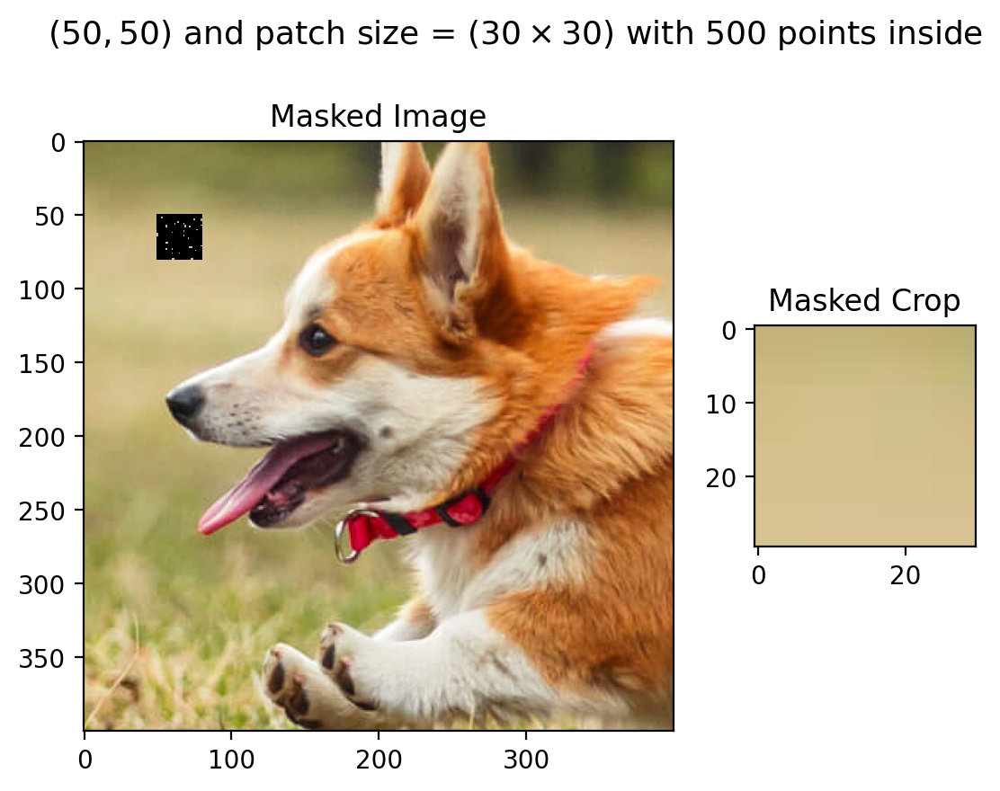

In [89]:
imgSingle30, croppedSingle30, _ = insert_points(500, img_scaled, (50, 50), 30)

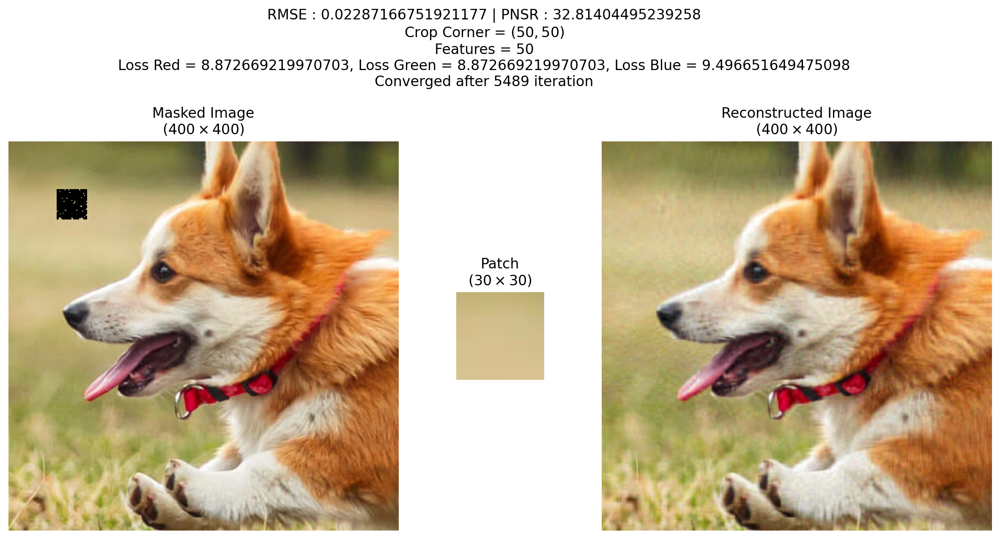

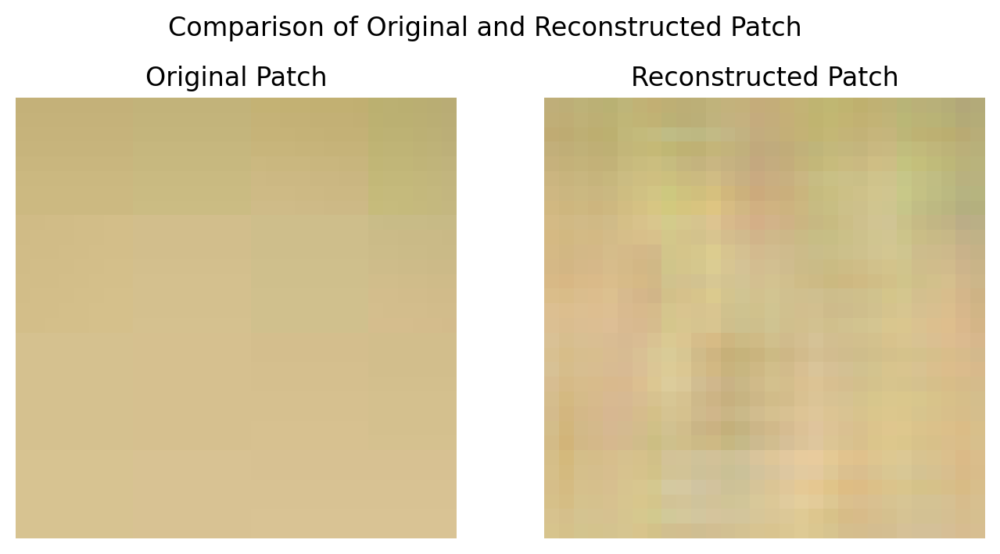

In [82]:
features, nums, epochs, convergence = 50, 500, 10000, 1e-6
train_reconstruct(nums, epochs, img_scaled, (50, 50), 30, features, convergence, device, display = False)

### $(30 \times 30)$ frame with **2-3 Colors**

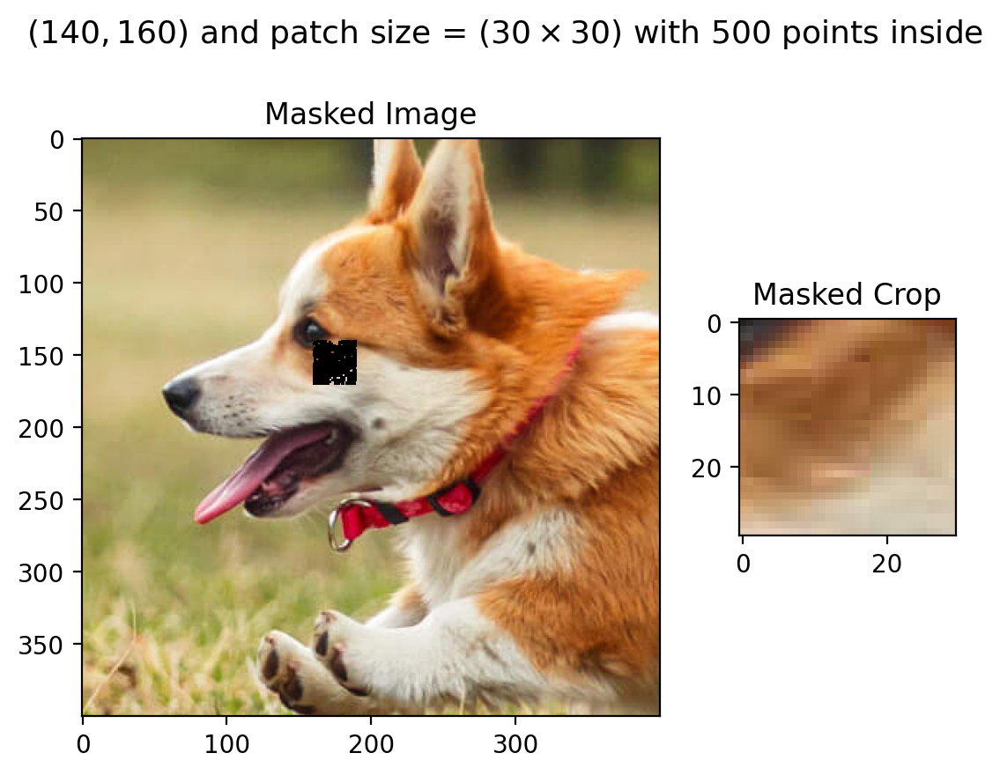

In [91]:
imgDouble30, croppedDouble30, _ = insert_points(500, img_scaled, (140, 160), 30)

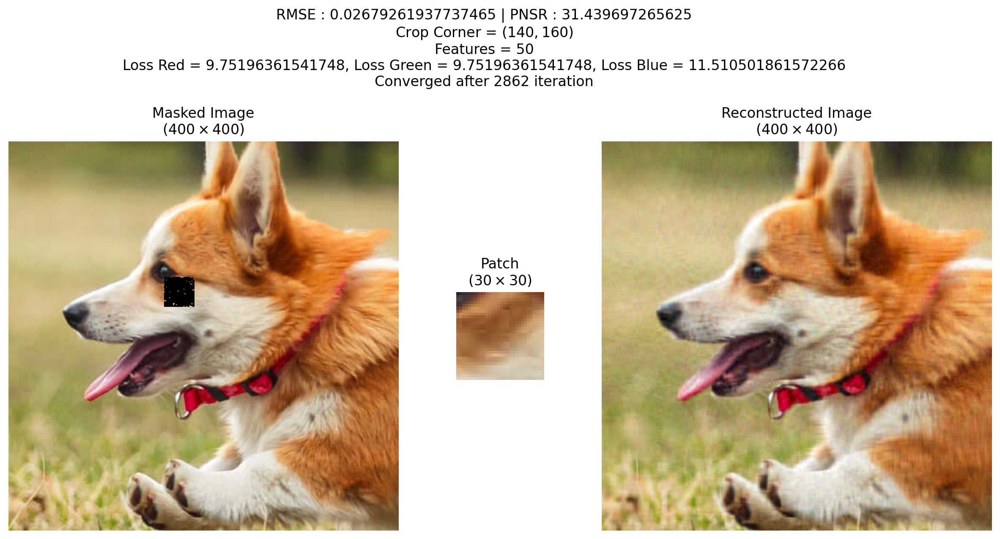

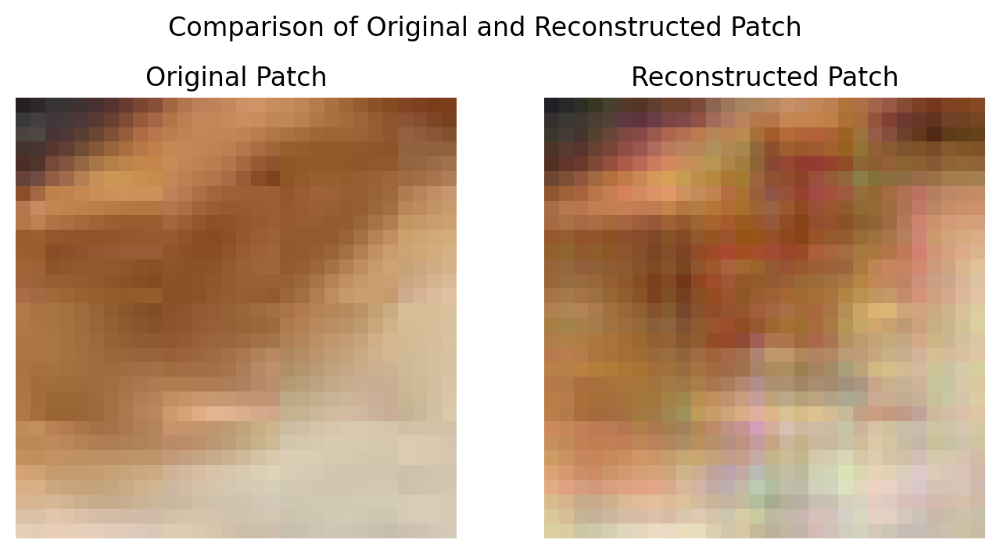

In [84]:
features, nums, epochs, convergence = 50, 500, 10000, 1e-6
train_reconstruct(nums, epochs, img_scaled, (140, 160), 30, features, convergence, device, display = False)

### $(30 \times 30)$ frame with atleast **5 Colors**

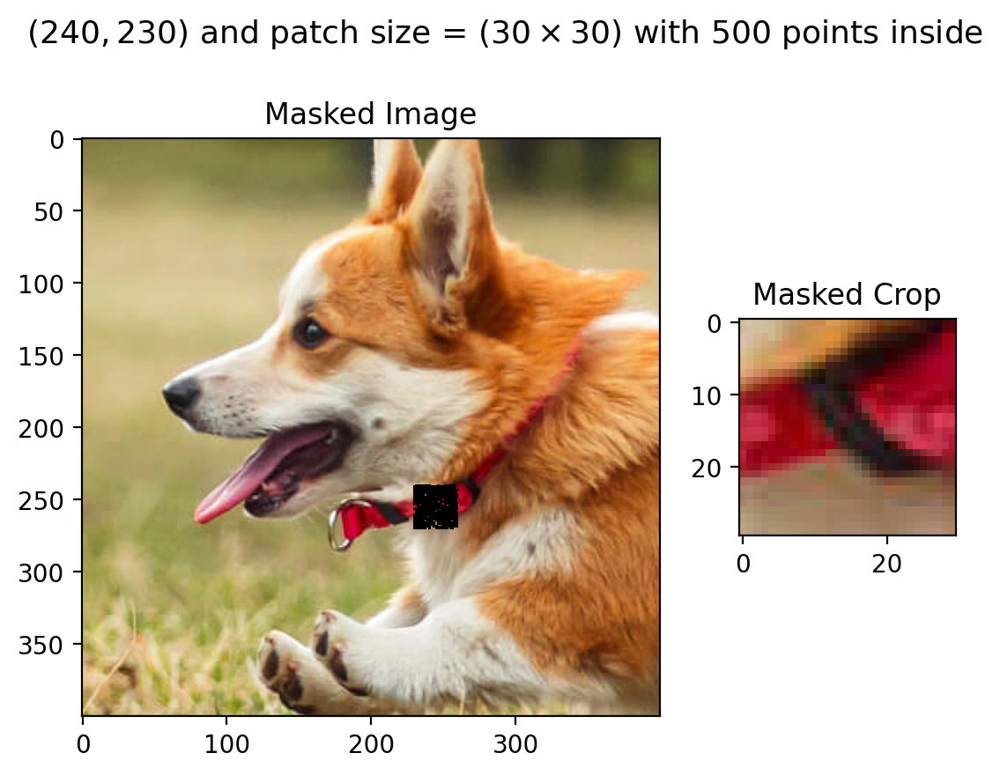

In [92]:
imgMulti30, croppedMulti30, _  = insert_points(500, img_scaled, (240, 230), 30)

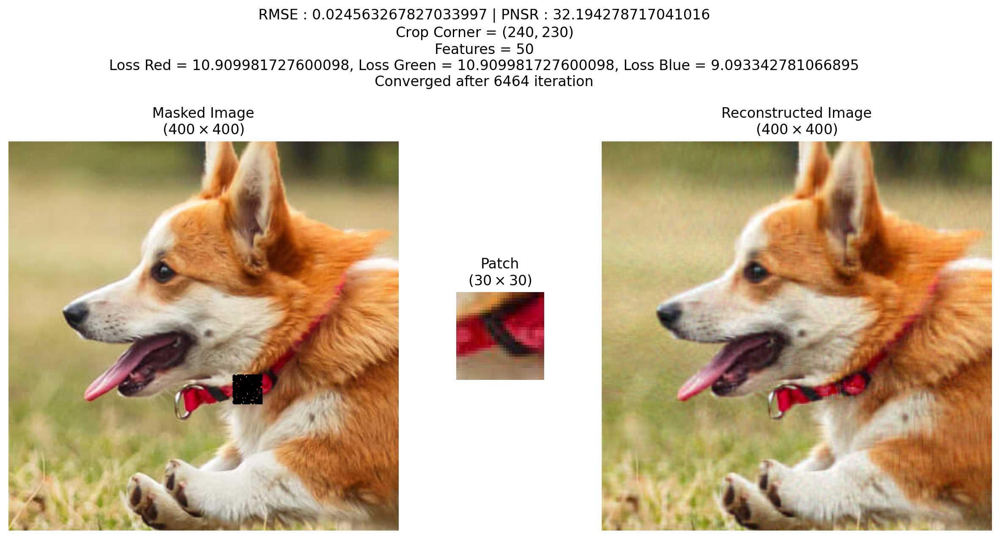

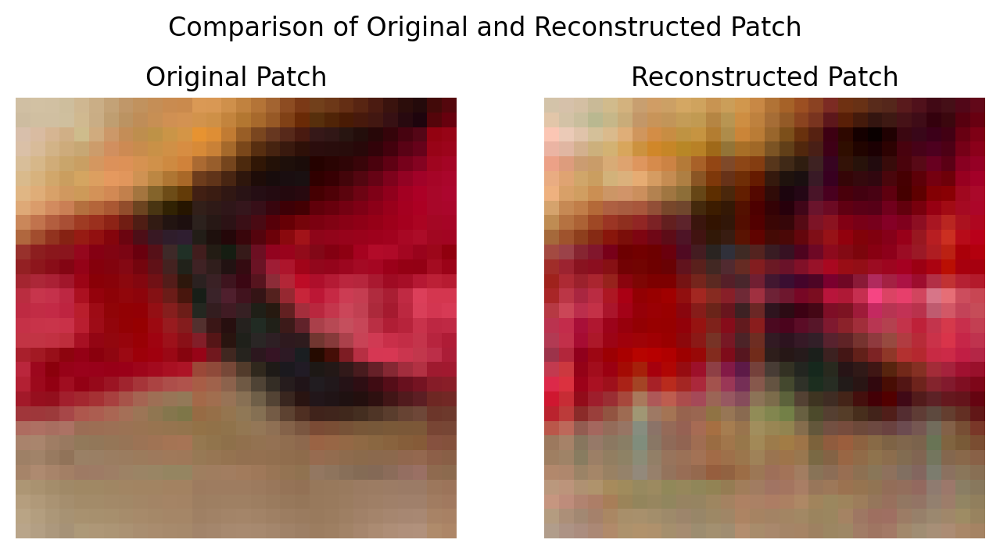

In [86]:
features, nums, epochs, convergence = 50, 500, 10000, 1e-6
train_reconstruct(nums, epochs, img_scaled, (240, 230), 30, features, convergence, device, display = False)

### Testing the Hypothesis of $$\alpha = \frac{\text{Points inserted in the Patch}}{\text{Total Points in the Patch}}$$
### $\alpha$ vs. $\text{PSNR}$ and $\text{RMSE}$

In [96]:
rmses, psnrs = [], []
features, nums, epochs, convergence = 50, 500, 5000, 1e-5
numbers = list(range(10, 1000, 10))
for nums in numbers:
  rmse, psnr, frac = train_reconstruct(nums, epochs, img_scaled, (240, 230), 60, features, convergence, device, display = False, displayAll = False, allowMetrics = True)
  rmses.append(rmse)
  psnrs.append(psnr)

## RMSE Trend v/s Density of points in patch

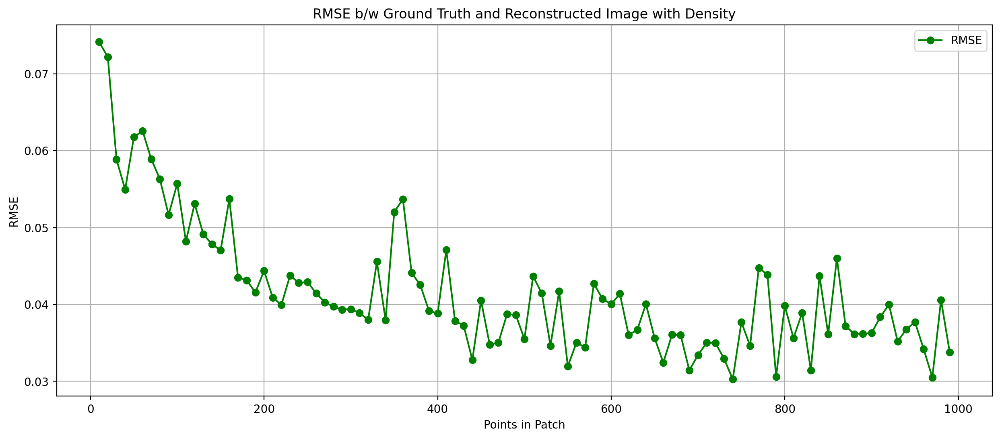

In [97]:
rm = [x.detach().cpu().numpy() for x in rmses]
plt.figure(figsize = (15, 6))
plt.plot(range(10, 1000, 10), rm, marker = "o", label = "RMSE", color = "green")
plt.xlabel(r"Points in Patch")
plt.ylabel("RMSE")
plt.title("RMSE b/w Ground Truth and Reconstructed Image with Density")
plt.grid()
plt.legend()
# for i, psnr in enumerate(rm):
#     plt.annotate(f'{psnr:.4f}', (range(10, 1000, 10)[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
#                  bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()

## PSNR Trend v/s Density of points in patch

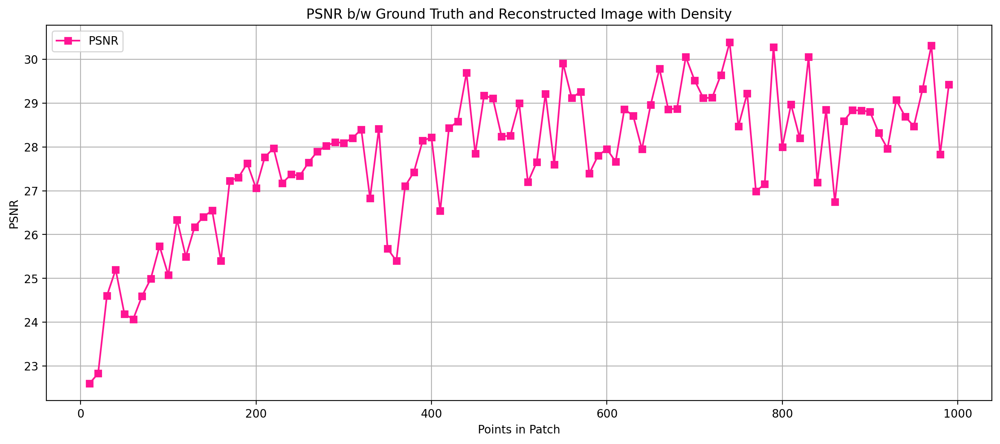

In [99]:
plt.figure(figsize = (15, 6))
plt.plot(range(10, 1000, 10), psnrs, marker = "s", label = "PSNR", color = "deeppink")
plt.xlabel(r"Points in Patch")
plt.ylabel("PSNR")
plt.title("PSNR b/w Ground Truth and Reconstructed Image with Density")
plt.grid()
plt.legend()
# for i, psnr in enumerate(psnrs):
#     plt.annotate(f'{psnr:.4f}', (range(10, 1000, 10)[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
#                  bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()